# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**<u>Цель:</u>** исследовать рынок Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**<u>Задачи:</u>**

+ Изучить сткрутуру данных;
+ Изучить наличие пропусков, дубкатов и других аспектов, которые могут повлиять на ход работы;
+ Провести анализ общих данных, выявить закономерности; 
+ Изучить данные о кофейнях, выявить лучшие параметры для её открытия;
+ Сделать отчёт в виде презентации.


**<u>Описание данных:</u>** 

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Файл `moscow_places.csv`:
+ `name` — название заведения;
+ `address` — адрес заведения;
+ `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
+ `hours` — информация о днях и часах работы;
+ `lat` — широта географической точки, в которой находится заведение;
+ `lng` — долгота географической точки, в которой находится заведение;
+ `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
+ `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
+ `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  + «Средний счёт: 1000–1500 ₽»;
  + «Цена чашки капучино: 130–220 ₽»;
  + «Цена бокала пива: 400–600 ₽».
  + и так далее;
+ `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  + Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  + Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  + Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
+ `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  + Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  + Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  + Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
+ `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
+ `district` — административный район, в котором находится заведение, например Центральный административный округ;
+ `seats` — количество посадочных мест.

___
## Изучение данных и их предобработка

До начала исследования необходимо изучить и подготовить данные к работе.

In [1]:
#импортируем бибилиотеки
import pandas as pd
import warnings
import folium
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем карту и хороплет
from folium import Map, Choropleth
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go

In [2]:
# путь к файлу
url = '/datasets/moscow_places.csv'

# записываем в переменную данные
places = pd.read_csv(url)

In [3]:
!pip install openpyxl

In [4]:
writer = pd.ExcelWriter('output.xlsx') 
# write dataframe to excel 
places.to_excel(writer) 
# save the excel 
writer.save()


In [5]:
# построим первые 5 строк датафрейма
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
#функция для предобработки данных

def preprocessing(file, file_name):
    print('Информация о таблице', file_name)
    print(file.info())
    print('___________________________')
    print('')
    
    print('Наличие явных дубликатов в', file_name)
    print(file.duplicated().sum())
    print('___________________________')
    print('')
    
    print('Наличие пропусков в таблице', file_name)
    print(file.isna().sum())

In [7]:
preprocessing(places, 'places')

Информация о таблице places
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None
___________________________


**Итак, всего у нас 8406 заведений. Во всех заведениях известно наименование, категория, метоположение, рейтинг и является ли заведение сетевым. Однако не все заведения указывают часы работы, количество мест и цены в своих заведениях. Данные содержат 3 типа: object, int64, float64**

Явных дубликатов нет, однако присутствуют множественные пропуски. К сожалению, обработать большую часть их них невозможно. Рабочие часы и количество мест зависит от помещения и внутреннего устава компаний. Столбцы middle_avg_bill и middle_coffee_cup не могут быть заполнены из-за отсутствия статистики. Также многие компании могли не заполнять столбец middle_coffee_cup, так как не являются кофейнями. Стоит проверить, можем ли мы заполнить хотя бы пропуски в столбце price, опираясь на столбец avg_bill. Для этого проверим есть ли закономерности между средними ценами и самим статусом ценового сегмента.

В теории можно заполнить пропусков:

In [8]:
warnings.simplefilter("ignore")
data_avg_bill = places[places['avg_bill'].apply(lambda x: 'счёт' in str(x))][places['price'].isna()]
print(len(data_avg_bill))

470


Посмотрим есть ли закономерности.

In [9]:
pd.options.display.max_colwidth = 500
places[places['avg_bill'].apply(lambda x: 'счёт' in str(x))][['price', 'avg_bill']].groupby('price')['avg_bill'].unique()

price
высокие          [Средний счёт:1500–2000 ₽, Средний счёт:2000–2500 ₽, Средний счёт:2100 ₽, Средний счёт:2000 ₽, Средний счёт:1500–3000 ₽, Средний счёт:2500–3000 ₽, Средний счёт:2000–3000 ₽, Средний счёт:4500–5500 ₽, Средний счёт:2500 ₽, Средний счёт:1500–5000 ₽, Средний счёт:1500–2500 ₽, Средний счёт:1500–1880 ₽, Средний счёт:5000–17000 ₽, Средний счёт:3500–4000 ₽, Средний счёт:от 2000 ₽, Средний счёт:от 1800 ₽, Средний счёт:1800 ₽, Средний счёт:3000 ₽, Средний счёт:4000–5000 ₽, Средний счёт:700–3000 ₽, Сред...
выше среднего    [Средний счёт:1500–1600 ₽, Средний счёт:1500 ₽, Средний счёт:1000–1500 ₽, Средний счёт:600–2000 ₽, Средний счёт:300–2000 ₽, Средний счёт:700–1500 ₽, Средний счёт:1200–1800 ₽, Средний счёт:от 1500 ₽, Средний счёт:1000–2000 ₽, Средний счёт:1200–1600 ₽, Средний счёт:1000–1300 ₽, Средний счёт:350–2400 ₽, Средний счёт:1200–1500 ₽, Средний счёт:1400–1600 ₽, Средний счёт:400–2500 ₽, Средний счёт:800–1500 ₽, Средний счёт:800–2000 ₽, Средний счёт:250–500 ₽, Средний

К сожалению, нельзя точно сказать как распределены группы. Среди высоких цен может быть средний чек от 700, среди категорий выше среднего могут быть средние счера в 250-500 рублей и так далее. Из-за этих пересечений нельзя утверждать, что по среднему счёту можно сразу определить категорию.

**Пропуски стоит оставить, чтобы избежать искажения данных. Явных дубликатов не выявлено.**

Для дальнейшей работы также необходимо создать несколько столцов:
+ столец `street` с названиями улиц из столбца с адресом
+ столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно


In [10]:
# создадим столбец с названием улицы
places['street'] = places['address'].apply(lambda x: x.split(sep=', ')[1])
# альтернативный способ
# places['street'] = places['address'].str.split(', ').str[1]

In [11]:
# создадим столбец, в котором будет отображено является ли сеть круглосуточной 
# и работает ои одна ежедневно
places['is_24/7'] = places[places['hours'].apply(lambda x: 'ежедневно, круглосуточно' in str(x))]['hours'] == 'ежедневно, круглосуточно'
places['is_24/7'] = places['is_24/7'].fillna(False)

# альтернативный способ
# places['is_24/7'] = places['hours'].str.contains('ежедневно, круглосуточно')

In [12]:
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Создание функций для графиков

In [13]:
def heatmap(data, index, columns, values, aggfunc, title):
    data = data.pivot_table(index=index, columns=columns, values=values, aggfunc=aggfunc)
    plt.figure(figsize=(14,6))
    plt.title(title)
    sns.heatmap(data, annot=True)
    plt.show()

In [14]:
def bar(data, index, values, aggfunc, title):
    fig = px.bar(data.pivot_table(index=index, values=values, aggfunc=aggfunc), title=title)
    fig.show()

In [15]:
def map(data, group, column, agg, title):
    rating_df = data.groupby(group, as_index=False)[column].agg(agg)
    
    # загружаем JSON-файл с границами округов Москвы
    state_geo = '/datasets/admin_level_geomap.geojson'
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423
    
    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    
    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=rating_df,
        columns=[group, column],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)
    
    # выводим карту
    return m

<div style="border:solid green 2px; padding: 20px">
    
        Итак, в ходе данного раздела мы посмотрели структуру данных, убедились, что нет явных дубликатов и посмотрели пропуски. Также были добавлены столбцы с улицей и информацией о том, является ли заведение круглосуточным. также созданы функции для графиков.
    
</div>

___
## Анализ данных

Теперь можно приступить к анализу данных. Для этого стоит сделать:
+ исследовать категории заведений;
+ исследовать сетевые заведения;
+ исседовать районы и улицы Москвы.

### Исследование категорий заведений

Начнём с исследования категорий.

In [16]:
category = places['category'].unique()
print('Всего у нас есть', len(category), 'категорий:', '; '.join(category))

Всего у нас есть 8 категорий: кафе; ресторан; кофейня; пиццерия; бар,паб; быстрое питание; булочная; столовая


До начала определим сколько у нас заведений разных категорий. Для удобства представим результат в видк круговой диаграммы:

In [17]:
count_category = places.pivot_table(index=['category'], values='address', aggfunc='count').sort_values(by = 'address', ascending=False)
count_category.columns= ['values']

name_cat = count_category.index
values = count_category['values']

fig = go.Figure(data=[go.Pie(labels=name_cat, values=values, pull=[0.2, 0.1, 0.05])])
fig.update_layout(title='Распределение количества заведений по категориям')          
fig.show() 

**Итак, больше всего в Москве кафе, на втором месте ресторане, на третьем кофейни.**

Теперь проверим, как распределены категории по районам Москвы.

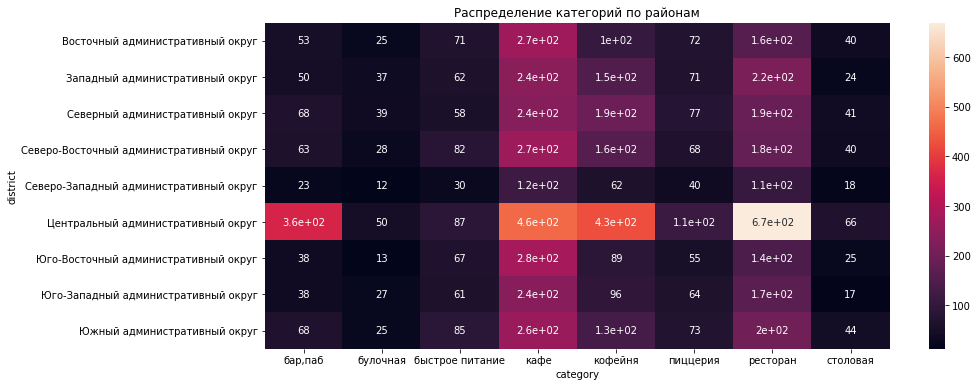

In [18]:
heatmap(places, 'district', 'category', 'address', 'count', 'Распределение категорий по районам')

**Больше всего выделяется центральный округ. Там больше всего заведений и больше всего именно рестиранов. Кафе во всех регионах лежат в дианопозе от 200 до 500. Также можно заметить, что больше всего пабов именно в центральном районе.**

Обычно в городах бывают улицы, где больше всего определённых заведений, например в СПб улица Рубенштейна известна как "улица баров". Выявим, есть ли подобные улицы в Москве. Будем считать, что соотношение верно, если хотя бы 5% заведений от общего количества находятся на конкретной улице.

In [19]:
a = places.pivot_table(index='street', columns='category', values='address', aggfunc='count')
df = pd.DataFrame()
df['count'] = places['category'].value_counts()
df['max_street'] = a.max()
df['street'] = a.idxmax()
df['per'] = df['max_street'] / df['count'] * 100
df

,count,max_street,street,per
кафе,2378,53.0,проспект Мира,2.228764
ресторан,2043,45.0,проспект Мира,2.202643
кофейня,1413,36.0,проспект Мира,2.547771
"бар,паб",765,15.0,Ленинградский проспект,1.960784
пиццерия,633,15.0,Профсоюзная улица,2.369668
быстрое питание,603,21.0,проспект Мира,3.482587
столовая,315,7.0,Варшавское шоссе,2.222222
булочная,256,4.0,Ленинградский проспект,1.562500


**По имеющимся данным не удалось выявить зависимость улиц и категорий заведений.**

Теперь проверим количество посадочных мест по категориям. До начала вывелем среднее и медианное значения, чтобы понять, как они различаются. Затем построим heatmap, чтобы понять, как среднее количество мест по категориям зависит от: местоположения(района) ,сети и круглосуточности. 

In [20]:
places.pivot_table(index='category', values='seats', aggfunc=['mean', 'median'])

,mean,median
,seats,seats
category,,
"бар,паб",124.532051,82.5
булочная,89.385135,50.0
быстрое питание,98.891117,65.0
кафе,97.512315,60.0
кофейня,111.199734,80.0
пиццерия,94.496487,55.0
ресторан,121.944094,86.0
столовая,99.750000,75.5


Можно заметить, что среднее и медианные значения достаточно сильно отличаются. Посмотрим по графикам от каких параметров может зависеть.

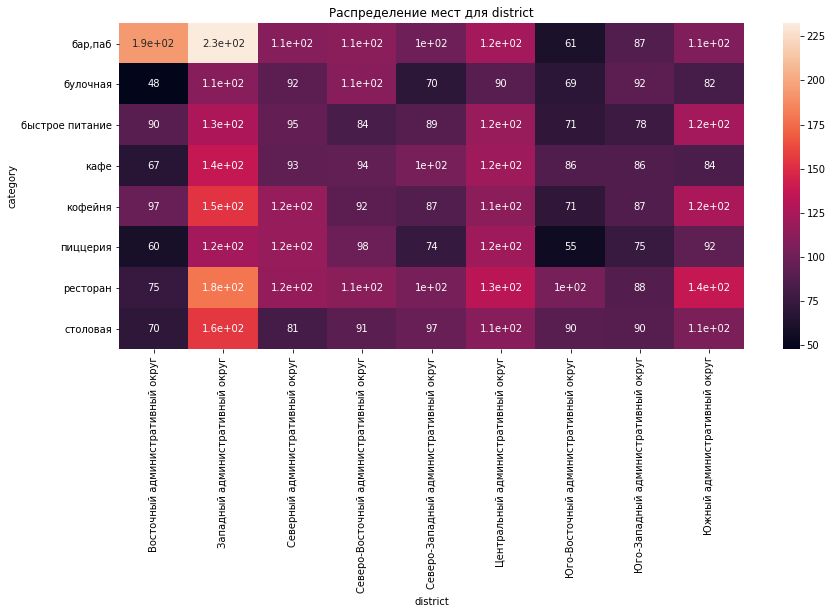

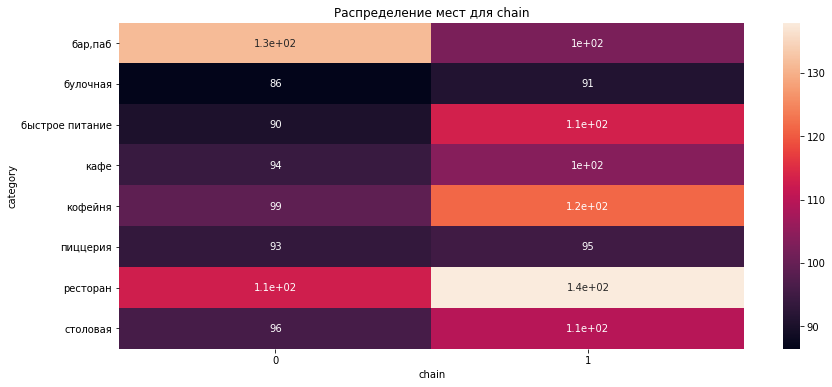

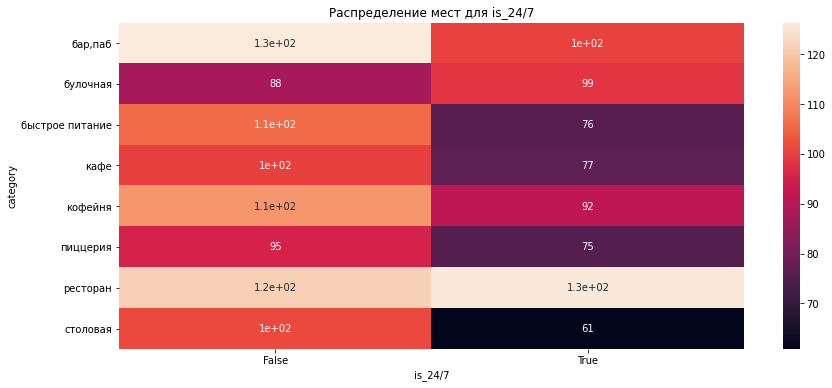

In [21]:
values = ['district', 'chain', 'is_24/7']
for i in values:
    heatmap(places, 'category', i, 'seats', 'mean', ('Распределение мест для ' + i))

**В среднем больше всего посадочных мест в барах и рестоанах, при этом самое большое количество мест в Западном округе. Из несетых заведений больше всего посадочных мест также в рестаранах и пабах, а в сетевых заведениях лидируют рестораны, однако также много посадочных мест в кофейнях. В среднем в круглосуточных ресторанах больше всего мест, а не в круглосуточных больше всего мест в барах.**

Теперь изучим рейтинги заведений по категориям.

In [22]:
data = pd.DataFrame(places.groupby('category')['rating'].mean())
data

,rating
category,
"бар,паб",4.387712
булочная,4.268359
быстрое питание,4.050249
кафе,4.123886
кофейня,4.277282
пиццерия,4.301264
ресторан,4.290357
столовая,4.211429


Теперь визуализируем рейтинги.

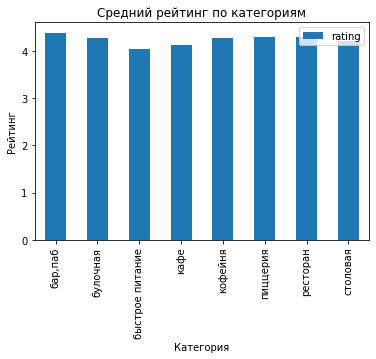

In [23]:
data.plot(kind='bar')
plt.title('Средний рейтинг по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.show()

**Как можно заметить, все средние рейтинги выше 4 баллов, однако у быстрого питания они самые низкие. В среднем, самые высокие рейтинги у баров и пабов.**

После изучения категории заведений можно сделать следующие выводы:
+ Больше всего по Мск кафе, ресторанов и кофеен;
+ Самый популярный район - Центральный;
+ В Мск нет улиц, которые бы отличались количеством определённых мест;
+ Больше всего посадочных мест нужно чтобы открыть ресторан или бар. Меньше всего мест нужно для булочных.
+ По категориями средний рейтинг не сильно отличается, однако у быстрого питания они ниже всего, а у баров выше всего.

### Исследование сетевых заведений

На данном этапе стоит рассмотреть сетевые заведения. Рассмотреть сколько их по отношению к несетевым и посмотреть, как зависит сеть от разных параметров.

In [24]:
count_chain = places.pivot_table(index=['chain'], values='address', aggfunc='count').sort_values(by = 'address', ascending=False)
count_chain.columns= ['values']

name_chain = count_chain.index
values = count_chain['values']

fig = go.Figure(data=[go.Pie(labels=name_chain, values=values)])
fig.update_layout(title='Распределение количества заведений по сетям')          
fig.show() 

**Сетевых заведений 38,1% от общего числа заведений.**

Теперь рассмотрим сами сетевые заведения.

In [25]:
chain_places = places[places['chain'] == 1]

In [26]:
chain = ['в сетевых заведениях', 'в несетевых заведениях']
titles = ['Количесво заведений по категориям ', 'Количество заведений по районам ', 'Количество заведений по круглосуточности ']
index = ['category', 'district', 'is_24/7']
for i in range(len(index)):
    bar(chain_places, index[i], 'name', 'count', (str(titles[i]) + str(chain[0])))

**Итак, больше всего сетевых заведений являются кафе, кофейнями и ресторанами и больше всего их расположено в центральном районе. Зачастую они не круглосуточные.**

Теперь рассмотрим несетевые заведения.

In [27]:
not_chain_places = places[places['chain'] == 0]

In [28]:
for i in range(len(index)):
    bar(not_chain_places, index[i], 'name', 'count', (str(titles[i]) + str(chain[1])))

**Несетевыми часто являются некруглосуточные кафе в ценральном районе**

Итак,
+ Несетевых заведений больше, чем сетевых, сетевые заведения занимают 38,1% от общего числа заведений;
+ Самое большое количество сетевых заведений являются кафе, ресторанами и кофейнями, располагаются чаще всего в центральном районе и не являются круглосуточными;
+ Самое большое количество несетвых заведений - некруглосуточные кафе в центральном районе.

Теперь изучим сами заведения. В дальнейшем будем рассматривать только сетевые, т.е. использовать таблицу `chain_places`.

До начала выведем топ-15 сетевых заведений

In [29]:
count_category = pd.DataFrame(chain_places.groupby('name').count().sort_values(by='category', ascending=False).head(15)['category'])
count_category.columns= ['values']

name_cat = count_category.index
values = count_category['values']

fig = go.Figure(data=[go.Pie(labels=name_cat, values=values, pull=[0.2, 0.1, 0.05])])
fig.update_layout(title='Топ-15 сетевых заведений')          
fig.show() 

**Итак, самыми популярными по Мск являются Шоколадница, Домино'с пицца и Додо Пицца**

Теперь посмотрим на категории этих заведений.

In [30]:
top = pd.DataFrame(chain_places.groupby('name').count().sort_values(by='category', ascending=False).head(15)['category']).index
pd.DataFrame(chain_places.query('name in @top').groupby('name')['category'].unique())

,category
name,
CofeFest,"[кофейня, кафе]"
Cofix,[кофейня]
One Price Coffee,[кофейня]
Prime,"[ресторан, кафе]"
Буханка,"[булочная, кофейня, кафе]"
Додо Пицца,[пиццерия]
Домино'с Пицца,[пиццерия]
КОФЕПОРТ,[кофейня]
Кулинарная лавка братьев Караваевых,[кафе]


**Как было выяснено ранее, больше всего ресторанов, кафе и кофеен, однако также есть 2 большие сети пиццерий по городу. Вероятнее всего это связано с размером этих сетей, значит конкурировать с ними будет сложно.**

### Изучение районов и улиц

Не менее важно рассмотреть информацию по районам города.

In [31]:
district = places['district'].unique()
print('Всего у нас есть', len(district), 'районов:', '; '.join(district))

Всего у нас есть 9 районов: Северный административный округ; Северо-Восточный административный округ; Северо-Западный административный округ; Западный административный округ; Центральный административный округ; Восточный административный округ; Юго-Восточный административный округ; Южный административный округ; Юго-Западный административный округ


Построим графики распределения категорий по районам.

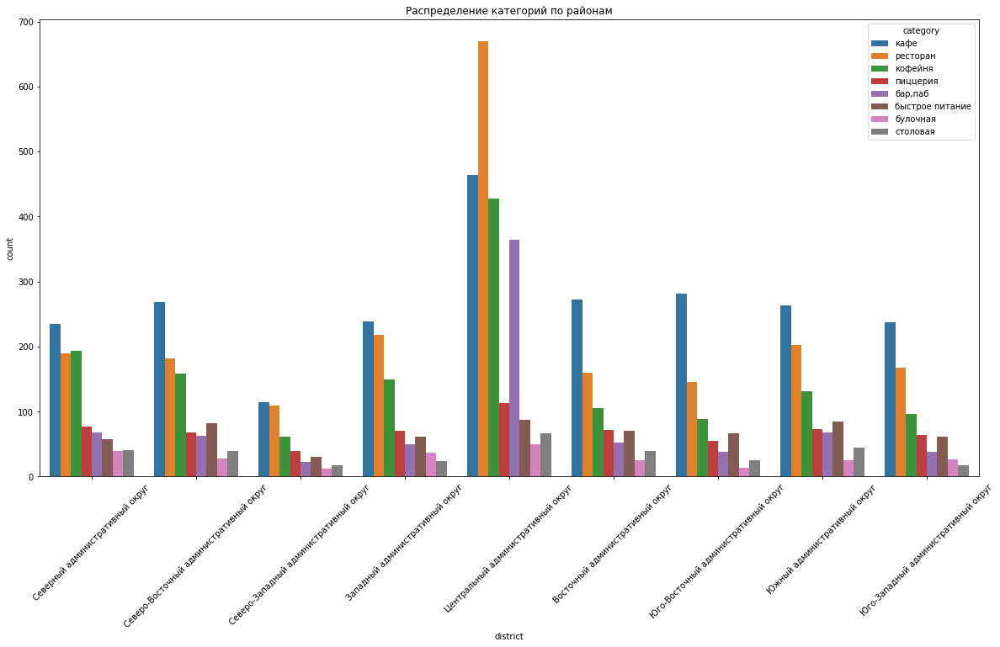

In [32]:
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='category', data=places)
plt.xticks(rotation=45)
plt.title('Распределение категорий по районам')
plt.show()

**В северном, восточном, юго-восточном, юго-западном и северо-восточном районах больше всего кафе, в северо-западном, южном и западном больше всего кафе и ресторанов, в центральном больше всего ресторанов**

Также можно рассмотреть рейтинги по регионам.

In [33]:
data = pd.DataFrame(places.groupby('district')['rating'].mean())
data

,rating
district,
Восточный административный округ,4.174185
Западный административный округ,4.181551
Северный административный округ,4.239778
Северо-Восточный административный округ,4.148260
Северо-Западный административный округ,4.208802
Центральный административный округ,4.377520
Юго-Восточный административный округ,4.101120
Юго-Западный административный округ,4.172920
Южный административный округ,4.184417


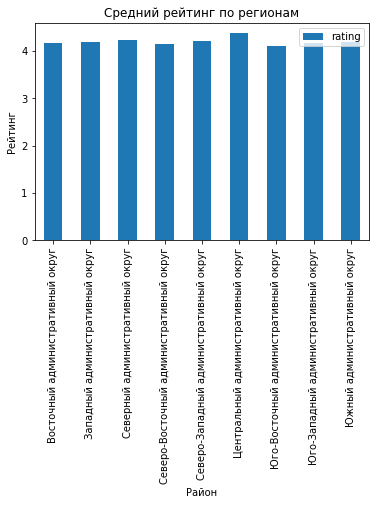

In [34]:
data.plot(kind='bar')
plt.title('Средний рейтинг по регионам')
plt.xlabel('Район')
plt.ylabel('Рейтинг')
plt.show()

**Самые высокие рейтинги в Центральном регионе, самые низкие в Юго-Восточном**

Теперь рассмотрим рейтинги по районам.

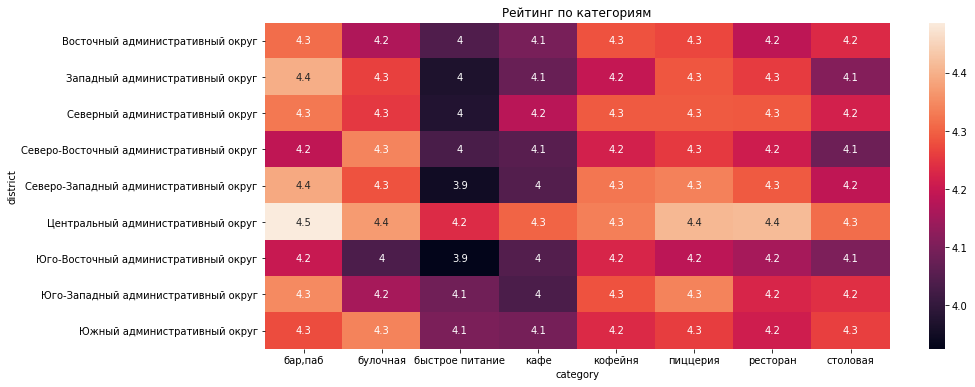

In [35]:
heatmap(places, 'district', 'category', 'rating', 'mean', 'Рейтинг по категориям')

**Здесь уже видна разница. Рейтинги у быстрого питания в некоторых районах ниже 4. Самые высокие оценки в Центральном районе, но даже в здесь оценки у быстрого питания самые низкие. Оценки выше 4,4 есть у баров, пиццерий и ресторанов. Средние оценки у кафе не в центральном районе ниже 4,3.**

Однако среднее значение не всегда показательно. Рассмотрим также медианное значение рейтинга по регионам.

In [36]:
map(places, 'district', 'rating', 'median', 'Медианный рейтинг заведений по районам')

**Самые хорошие рейтинги в Центральном районе.**

Теперь изучим улицы Москвы. Для этого выведем все заведения на карте с помощью кластеров, затем найдём топ-15 улиц по количеству заведений. Далее найдём улицы, на которых находится только один объект общепита. 

In [37]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

Составим топ-15 улиц

In [38]:
top_st_data = places.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)
# соделаем отдельно список топ-15 улиц
top_st = top_st_data.index
top_st_data

,name
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


Построим график распределения количества заведений и их категорий по улицам.

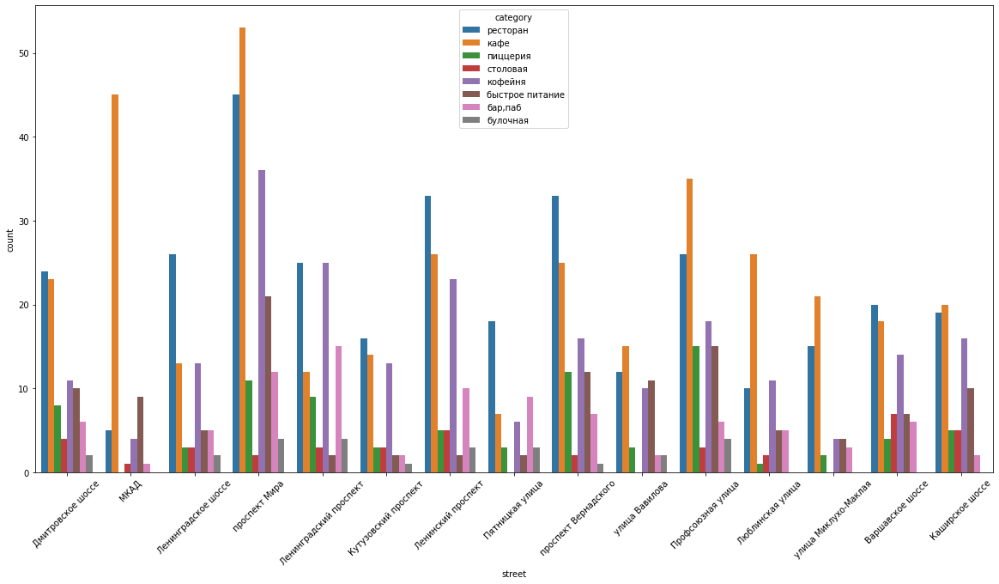

In [39]:
top_st_data = places.query('street in @top_st')
plt.figure(figsize=(20, 10))
sns.countplot(x='street', hue='category', data=top_st_data)
plt.xticks(rotation=45)
plt.show()

Как уже было выяснено ранее, по имеющимся данным нет улицы определённой категории. Однако можно выявить следующие закономерности:

**Больше всего кафе на улицах: МКАД, проспект Мира,Профсоюзная улица, Люблинская улица. Больше всего ресторанов: Ленинградское шоссе, Ленинградский проект, Ленинский проект, Пятницкая улица, проспект Вернадского. Больше всего кафе и ресторанов: Дмитровское шоссе, Кутузовский проект, улица Вавилова, Варшавское шоссе, Каширское шоссе.**

Однако важно помнить, что не всегда количество заведений определяет то, популярна ли она в плане питания в общем. Стоит посмотреть на размеры улиц, чтобы узнать, на каких улицах много заведений потому что они популярны, а на каких много заведений, потому что они большие.

In [40]:
# создадим список с цветами
color = ['blue', 'red', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', '#ADFF2F', '#CD5C5C', '#800000', '#FFA07A', '#20B2AA', '#00FA9A']
color_name = ['синий', 'красный', 'зелёный', 'фиолетовый', 'оранжевый', 'коричневый', 'розовый', 'серый', 'бирюзовый', 'салатовый', 'коралловый', 'тёмно-красный', 'светло-оранжевый', 'морской-голубой', 'ярко-салатовый']
# создадим таблицу, где присвоим кажой улице свой цвет
street_data = pd.DataFrame()
street_data['street'] = top_st
street_data['color'] = color
street_data['color_name'] = color_name
street_data

,street,color,color_name
0,проспект Мира,blue,синий
1,Профсоюзная улица,red,красный
2,проспект Вернадского,green,зелёный
3,Ленинский проспект,purple,фиолетовый
4,Ленинградский проспект,orange,оранжевый
5,Дмитровское шоссе,brown,коричневый
6,Каширское шоссе,pink,розовый
7,Варшавское шоссе,gray,серый
8,Ленинградское шоссе,cyan,бирюзовый
9,МКАД,#ADFF2F,салатовый


In [41]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
for i in range(len(top_st)):
    d = top_st_data[top_st_data['street'] == top_st[i]][['lat', 'lng']]
    folium.PolyLine(d, color=color[i]).add_to(m)
m

**Как можно заметить, МКАД появился в топе не из-за насыщенности заведениями, а из-за своего размера. Также большими можно назвать Дмитровское шоссе и Варшавское шоссе, однако лидеры топа, например проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, относительно Москвы не большие. Поэтому их по-прежнему можно считать популярными.**

Теперь изучим улицы, на которых находится только 1 заведение.

In [42]:
one_count = places.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
one_count.columns = ['count']
one_count = one_count[one_count['count'] == 1]
print('Всего', one_count.shape[0], 'таких улиц')

Всего 458 таких улиц


In [43]:
# создадим список таких улиц
one_count_st = one_count.index
# создадим датафрейм с этими улицами
one_count_data = places.query('street in @one_count_st')

Теперь проверим на рейтинги этих заведений.

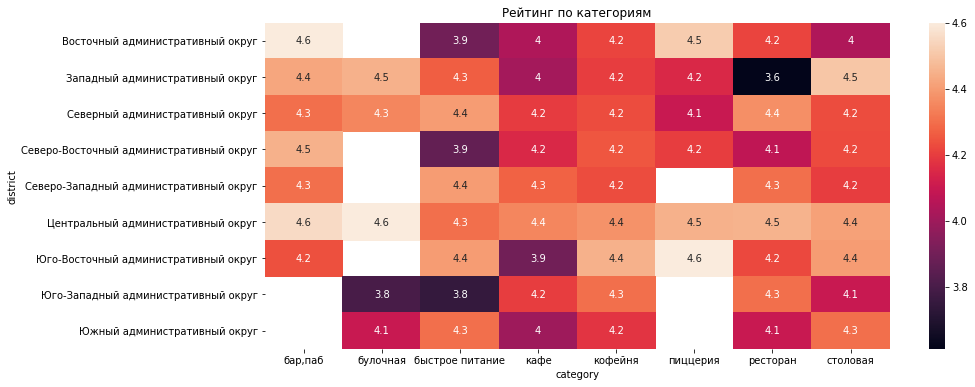

In [44]:
heatmap(one_count_data, 'district', 'category', 'rating', 'mean', 'Рейтинг по категориям')

Рейтинги в некоторых районах отсутствуют

**Можно заметить, что рейтинги достаточно высокие. Вероятнее всего это связано с тем, что у посетителей нет альтернатив. Возможно, открывать заведение на таких улицах будет выгодно в плане рейтинга.**

Теперь посмотрим, как связан рейтинг, сети и категории.

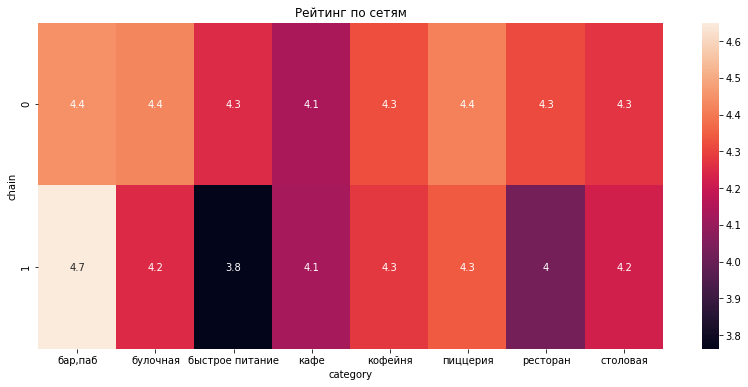

In [45]:
heatmap(one_count_data, 'chain', 'category', 'rating', 'mean', 'Рейтинг по сетям')

**У сетевых баров достаточно высокие рейтинги. Вероятнее всего конкурировать с ними будет сложно.**

Рассмотрим рейтинг по круглосуточности

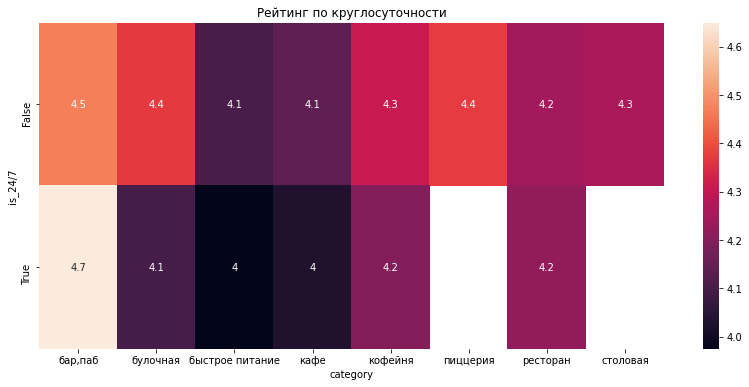

In [46]:
heatmap(one_count_data, 'is_24/7', 'category', 'rating', 'mean', 'Рейтинг по круглосуточности')

**Если у некруглосуточных заведений на этих улицах рейтинг может колебаться от 4.1 до 4.5. В круглосуточных отсутствует рейтинг у пиццерий и столовых. Самый высокий рейтинг у баров**

Теперь рассмотрим медианную стоимость заказа по районам.

In [47]:
map(places, 'district', 'middle_avg_bill', 'median', 'Медианные стоимости заказа в рублях')

**В центральном районе, западных и в юго-западных районах цены самые высокие. В других регионах цены значительно ниже. То есть чем дальше район от центра, тем ниже цены во всех направлениях, кроме западного и юго-западного.**

<div style="border:solid green 2px; padding: 20px">
    <p>
        <b>Выводы раздела:</b>
        <li>Больше всего по Мск кафе, ресторанов и кофеен.</li>
        <li>Самый популярный район – Центральный.</li>
    <li>В Мск нет улиц, которые бы отличались количеством определённых мест.</li>
    <li>Больше всего посадочных мест нужно чтобы открыть ресторан или бар. Меньше всего мест нужно для булочных.</li>
    <li>По категориями средний рейтинг не сильно отличается, однако у быстрого питания они ниже всего, а у баров выше всего.</li>
    <li>Большая часть заведений – несетевые, 38,1% круглосуточные.</li>
    <li>Большая часть заведений – некруглосуточные.</li>
    <li>Самыми популярными по Мск являются заведения: Шоколадница, Домино'с пицца и Додо Пицца.
    <li>По всем данным больше всего кафе, ресторанов и кофеен. Пиццерии вероятнее всего являются олигополией, поэтому конкурировать с ними будет сложно.</li>
    <li>В центральном районе очень много ресторанов. В остальные районах больше предпочитают кафе, но ресторанов также много.</li>
    <li>Самые высокие рейтинги в Центральном районе, самые низкие в Юго-Восточном.</li>
    <li>Самой большой по количеству заведений является улица проект Мира.  На ней, как и на многих других улицах больше всего кафе. Также на многих улицах большое количестве ресторанов.</li>
    <li>На 458 улицах находится только 1 заведение. На этих улицах, у некруглосуточных заведений рейтинг примерно одинаковый, а у круглосуточных самый высокий у баров, пиццерий и столовых. У сетевых заведений высокий рейтинг у баров.  Рейтинги относительно общих данных достаточно высокие. Особенно выделяются булочные, пиццерии и бары.</li>
    <li>Самые высокие цены не только в центральном районе. Также высокие цены в западном и юго-западных районах. Однако в остальных случаях цены ниже, чем в центральном районе.</li>
    </p>
</div>

___
## Детализируем исследование: открытие кофейни

Мечта заказчика - окрыть кофейню. Конкуренции они не бояться, поэтому рассматривать олигополию пиццерий не нужно. 

В данном разделе будут даны ответы на следующие вопросы:

+ Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
+ Есть ли круглосуточные кофейни?
+ Какие у кофеен рейтинги? Как они распределяются по районам?
+ На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [48]:
# создадим тодельную таблицу только с кофейнями
coffee_data = places[places['category'] == 'кофейня']

In [49]:
print('Всего в Москве', coffee_data.shape[0], 'кофеен')

Всего в Москве 1413 кофеен


Рассмотрим их распределение по районам.

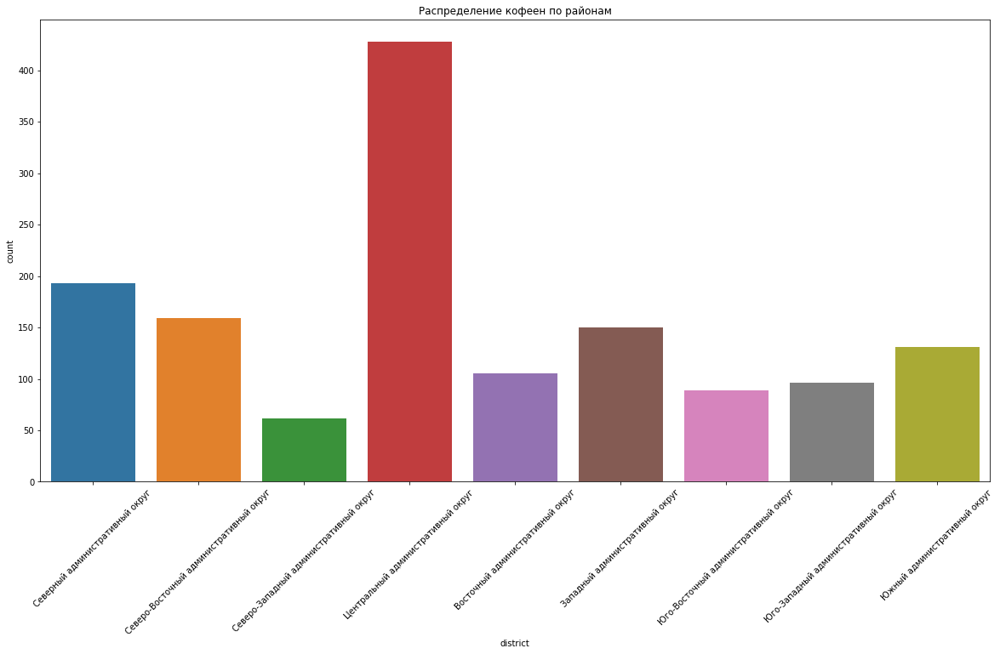

In [50]:
plt.figure(figsize=(20, 10))
sns.countplot(x='district', data=coffee_data)
plt.xticks(rotation=45)
plt.title('Распределение кофеен по районам')
plt.show()

Для удобства посмотрим на карте.

In [51]:
map(coffee_data, 'district', 'name', 'count', 'Количество кофеен по районам')

**Больше всего кофеен в центре. В остальных районах их количество от 50 до 200 заведений на район.**

Изучим круглосуточные кофейни.

In [52]:
print('Всего', coffee_data['is_24/7'].sum(), 'круглосуточных кофеен')

Всего 59 круглосуточных кофеен


Посмотрим как их количество зависит от района.

In [53]:
map(coffee_data, 'district', 'is_24/7', 'sum', 'Количество круглосуточных кофеен')

**Больше всего круглосуточных кофеен в центре. В остальных районах их почти нет. Однако некоторое количество присутствует в районах с большими ценами: западном и юго-западном**

Изучим рейтинги кофеен.

In [54]:
print('Медианный рейтинг всех кофеен равен',coffee_data['rating'].median() , '. Средний рейтинг:',coffee_data['rating'].mean())

Медианный рейтинг всех кофеен равен 4.3 . Средний рейтинг: 4.27728237791932


Посмотрим как рейтинги распределены на карте.

In [55]:
map(coffee_data, 'district', 'rating', 'median', 'Медианный рейтинг заведений по районам')

**В западном районе самые низкие рейтинги**

Дополнительно изучим количество посадочных мест.

In [56]:
map(coffee_data, 'district', 'seats', 'median', 'Медианное количество посадочных мест')

**Самые большое кофейни в западном районе.**

Рассмотрим стоимость чашки капучино.

In [57]:
print('Стоит ориентироваться на цену от', int(coffee_data['middle_coffee_cup'].median()), 'до', round(coffee_data['middle_coffee_cup'].mean()), 'рублей')

Стоит ориентироваться на цену от 170 до 175 рублей


In [58]:
map(coffee_data, 'district', 'middle_coffee_cup', 'median', 'Медианная цена чашки капучино')

<div style="border:solid green 2px; padding: 20px">
    <p>
        <b>Рекомендации:</b>
        <li>Самое большое количество кофеен, как не удивительно, в центре. меньше всего их на северо-востоке. Если следовать принципу: чем больше заведений, тем выше спрос, то центр - идеальное место для открытия кофейни.</li>
        <li>Очень мало круглосуточных кофеен в районе кроме центрального. Нет смысла искать персонал и оборудовать всё под круглосуточное заведение, так как конкурентного преимущества по сути это не даст. Люди, которые живут или ездят в центр ночью наверняка знают, что большая часть кофеен находится именно в центре и не будут замечать новую круглосуточную кофейню на окраине. Если же открывать кофейню в центре, то здесь стоит ичитывать тот факт, что ночью мало кто предпочтёт пить кофе. В основном все идёт в бары или рестораны. Поэтому даже в центре нет смысла открывать круглосуточную кофейню.</li>
        <li>Самые большие и самые низкие по рейтингам кофейни находятся в западном районе. Стоит избегать данный район, так как окрывать большую кофейню изначально - не очень хорошая идея, а низкие рейтинги могут привести к тому, что кофейня потеряет посетителей и разорится.</li>
        <li>Стоимость чашки капучино должна быть в среднем от 170 до 175 рублей. Такая цена позволит сохранять конкурентоспособность, так как она не будет в низком ценовом сигменте и не будет в высоком.</li>
    </p>
</div>

___
## Презентация

https://disk.yandex.ru/d/iqmMXNZYltv3dQ

____
## Выводы

В ходе данной работы были проделаны следующие шаги:
+ Изучена сткрутура данных;
+ проверено наличие дубликатов;
+ изучены пропуски. Выяснено, что их заполнение будет затруднительным;
+ проведён анализ данных всех категорий заведений;
+ изучены данные о кофейнях;
+ сделан отчёт в виде презентации.

<div style="border:solid green 2px; padding: 20px">
    <p>
        <b>Найденные закономерности и рекомендации:</b>
        <li>самые популярные виды заведений: кафе, ресторан и кофейни. Видимо, они пользуются наибольшим спросом. Поэтому открытие кофейни - отличная идея;</li>
        <li>вероятнее всего пиццерии образуют олигополию, из-за которой будет трудно с ними конкурировать;</li>
        <li>в Москве нет улицы, которая бы отличалась определённым видом заведений. Однако, самая популярная улица - Проект Мира;</li>
        <li>лучше всего открывать кофейню в Центральном районе, так как там больше всего заведений (при учёте, что заказчик не боится конкуренции);</li>
        <li>стоит избегать Западного района для открытия кофейни, так как там нужно открывать большую кофейню, также так самые низкие рейтинги, что может отталнуть потенциальных клиентов;</li>
        <li>стоит ориентироваться на количество мест от 65;</li>
        <li>средняя цена на капучино должна быть от 170 до 175 рублей;</li>
        <li>кофейня не обязательно должна быть круглосуточной.</li>
    </p>
            
    
</div>
